In [2]:
import solar_metrics_lib as sml
import pandas as pd
import numpy as np

In [43]:
dnn_df = pd.read_csv("metrics/linear_regression.csv",usecols=range(1,5))
dnn_df

,module_id,NOCT,R_SQUARE,MEAN_SQUARE_ERROR
0,PHL6621,46.376682,0.773756,9.822277
1,CRS0018,45.626111,0.790659,8.934362
2,QCL0182,49.851705,0.817340,3.484525
3,QCL0201,51.154273,0.788724,3.690972
4,QCL0346,47.461161,0.837089,3.688565


In [23]:
def panel_dataframe():
    solar_panel= {
        'module_id':["PHL6621","CRS0018","QCL0182","QCL0201","QCL0346"],
        'stc_power' :[369.6,382.6,382.78,376.66,446.39],
        'gamma':[-0.3935,-0.3779,-0.3730, -0.3637,-0.3642],
        'area':['1.98','2.06','1.895', 1.895,2.239],
        'cec_noct':[47.8,47.5,46.3,46.3,46.5]
        }
    df = pd.DataFrame(solar_panel)
    
    return df

df = panel_dataframe()
df2=df.query("module_id == 'CRS0018' | module_id == 'QCL0201'")
print(df2)

  module_id  stc_power   gamma   area  cec_noct
1   CRS0018     382.60 -0.3779   2.06      47.5
3   QCL0201     376.66 -0.3637  1.895      46.3


C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\ipykernel_launcher.py:4: DtypeWarning: Columns (0,4,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  after removing the cwd from sys.path.
C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\pandas\core\frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\ipykernel_launcher.py:4: DtypeWarning: Columns (0,4,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  after removing the cwd from sys.path.
C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\pandas\core\frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://

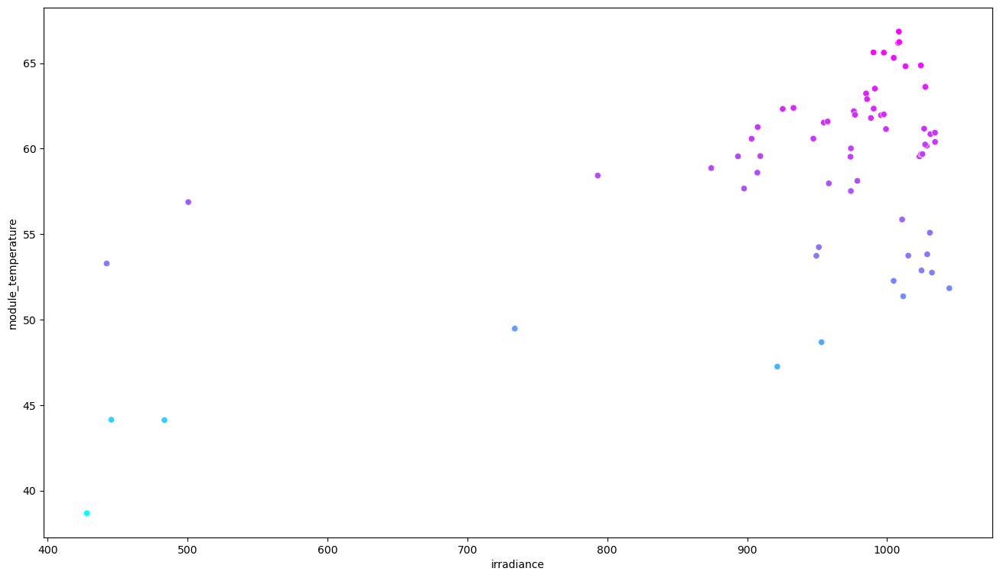

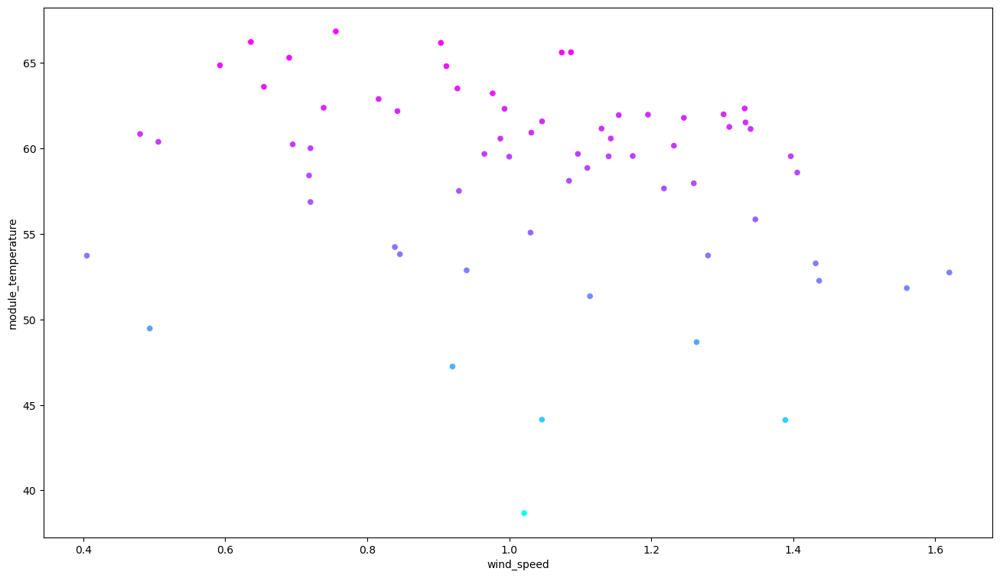

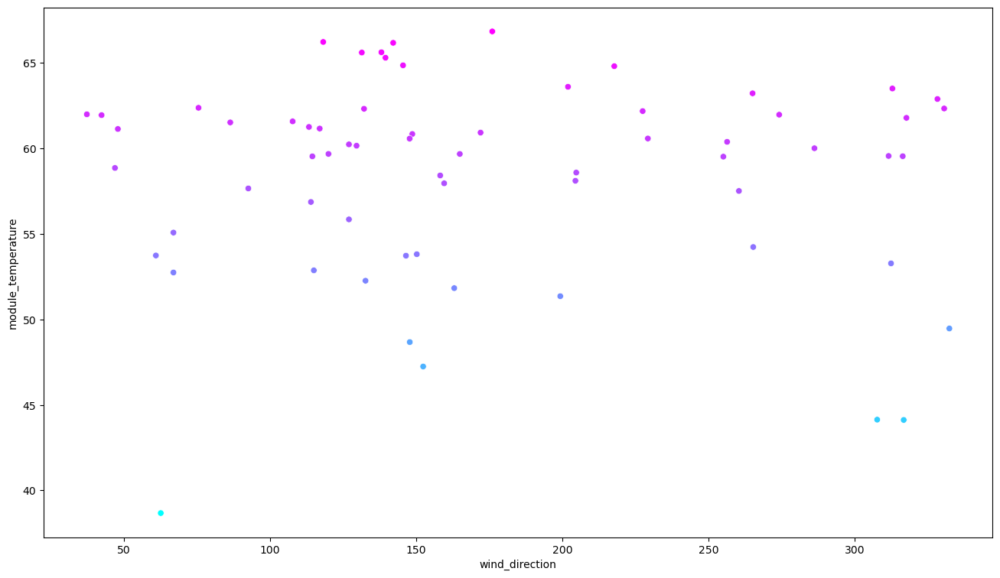

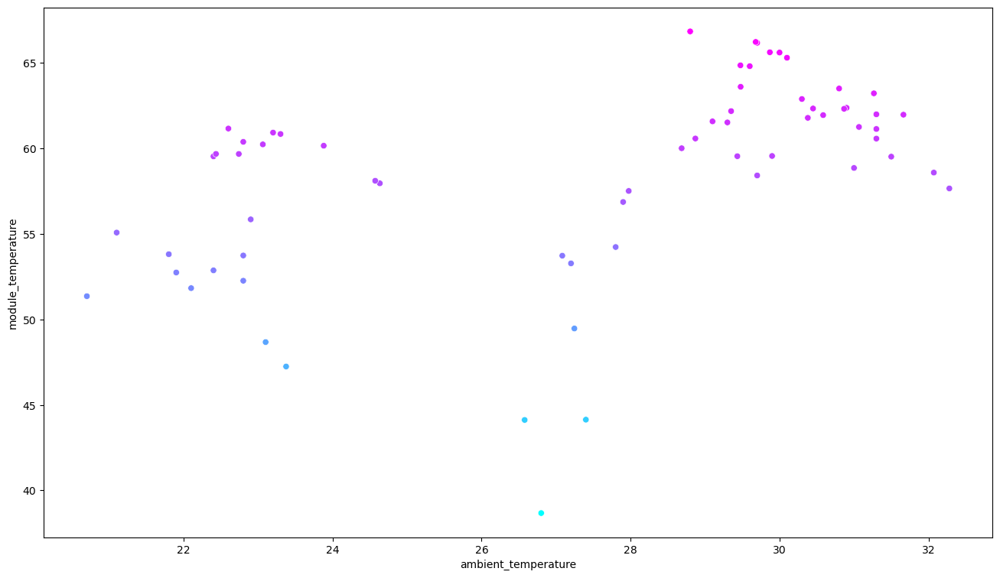

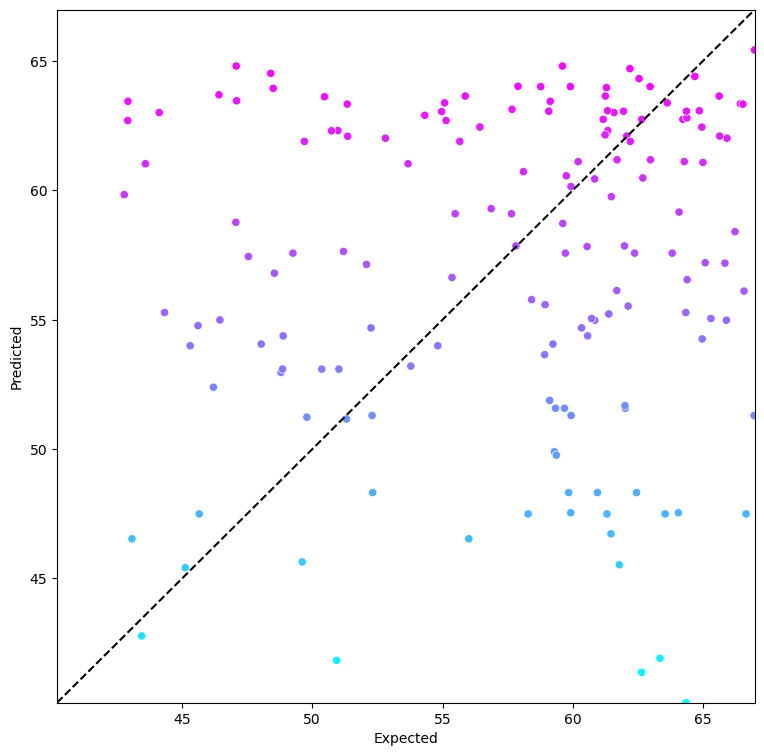

...

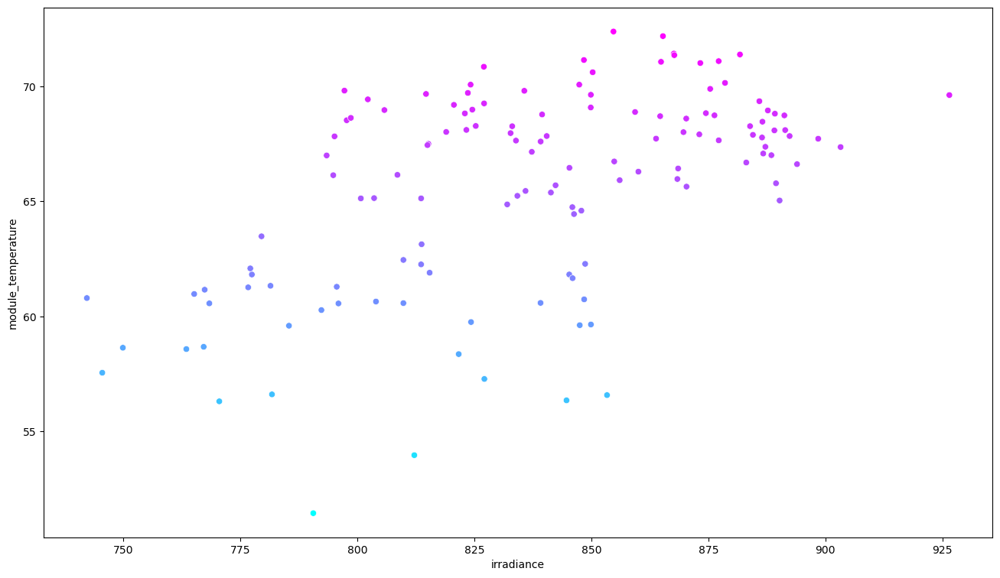

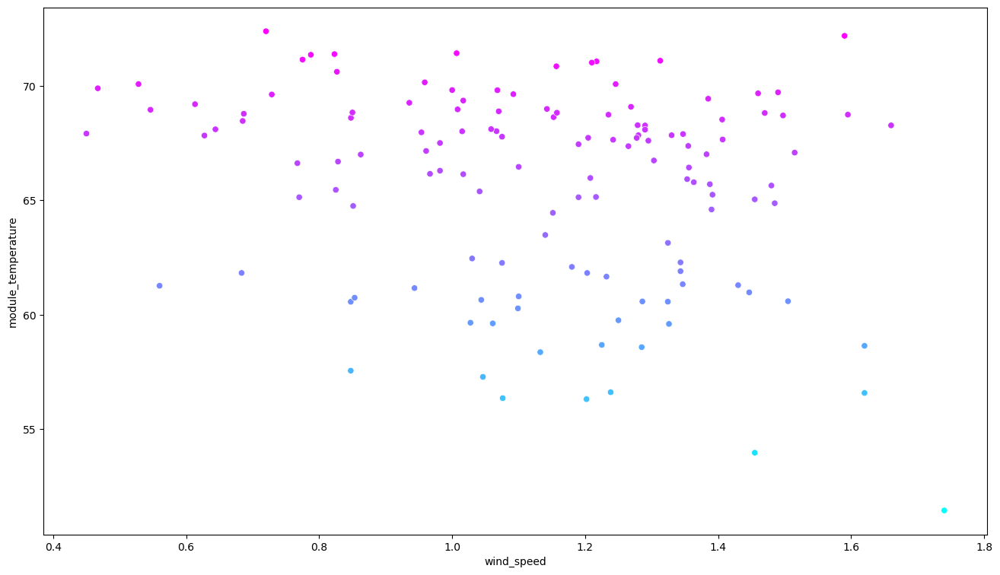

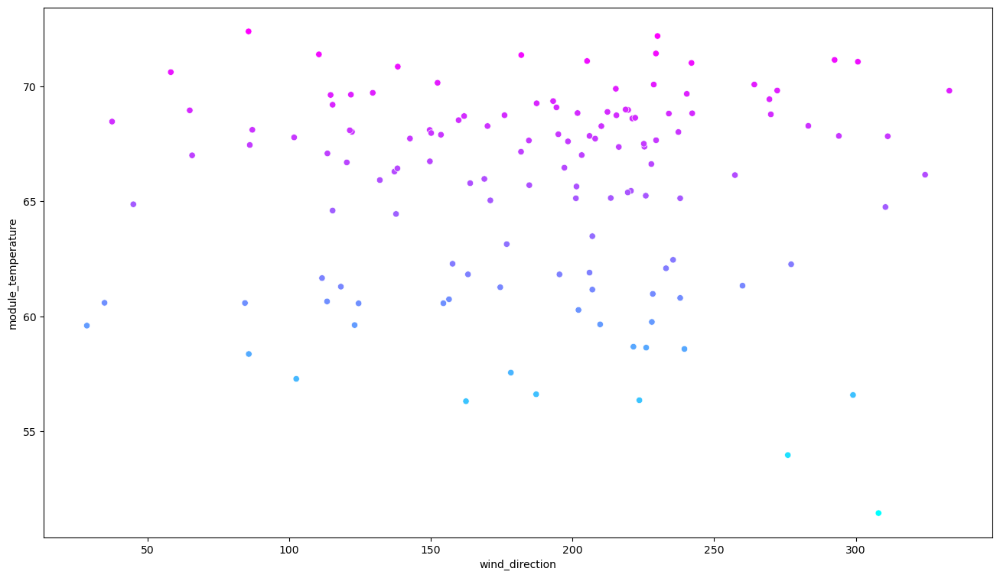

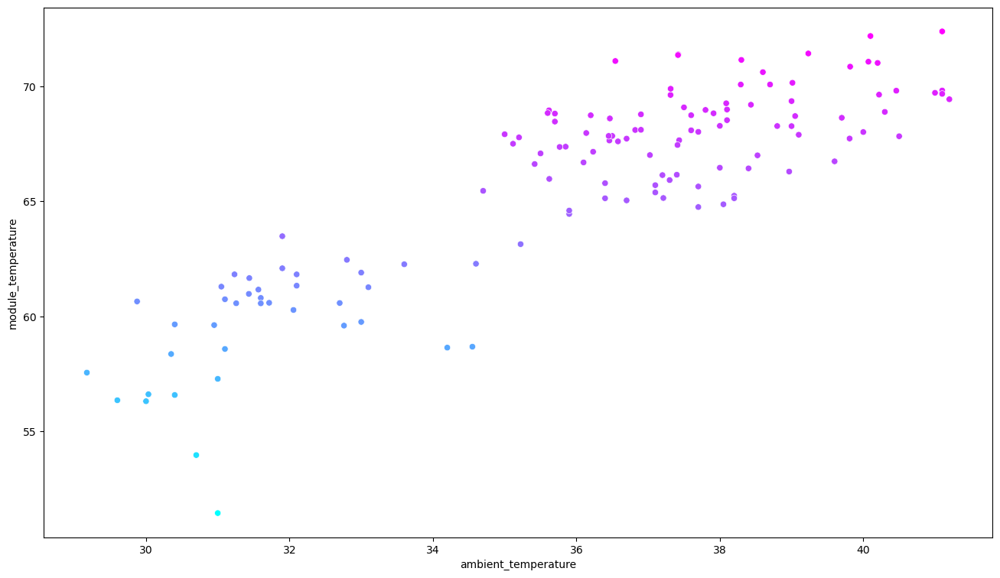

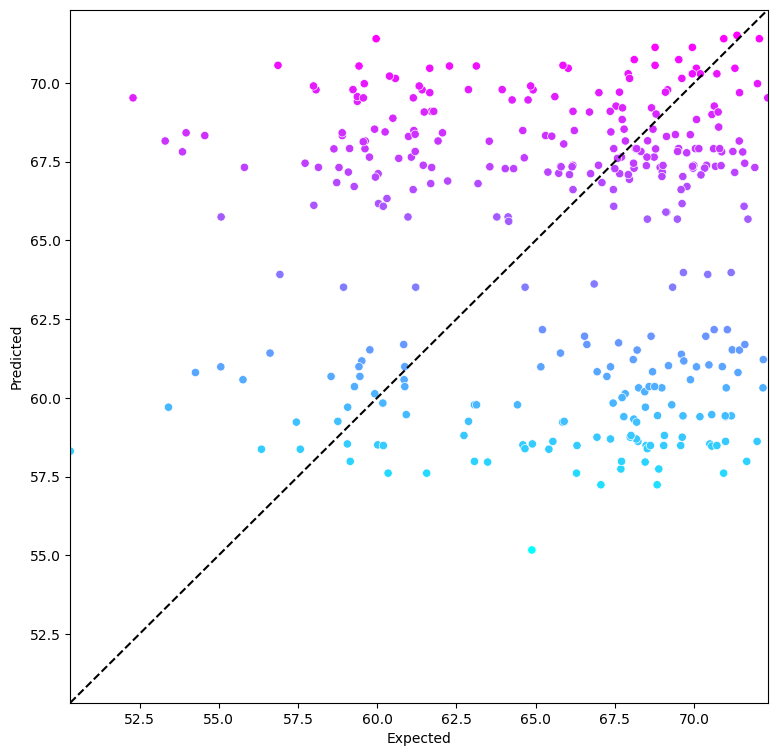

In [29]:
solar_panels = ["PHL6621","CRS0018","QCL0182","QCL0201","QCL0346"]
regressors={}
for pv in solar_panels:
    combined_data = sml.get_csv(pv)
    combined_df = sml.preprocessing(combined_data)
    #display(combined_df)
    mlr = sml.multiple_linear_regression(combined_df, pv)
    regressors[pv] = {'NOCT':mlr['noct'], 'R_SQUARE':mlr['r_square'], 'MEAN_SQUARE_ERROR':mlr['mse']}
regressor_dataframe = pd.DataFrame.from_dict(regressors, orient='index')
regressor_dataframe = regressor_dataframe.rename_axis("module_id").reset_index()
regressor_dataframe.to_csv('metrics/linear_regression.csv', sep=',')

In [30]:
regressor_dataframe

,module_id,NOCT,R_SQUARE,MEAN_SQUARE_ERROR
0,PHL6621,46.376682,0.773756,9.822277
1,CRS0018,45.626111,0.790659,8.934362
2,QCL0182,49.851705,0.817340,3.484525
3,QCL0201,51.154273,0.788724,3.690972
4,QCL0346,47.461161,0.837089,3.688565


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 64)                320       
                                                                 
 dense_5 (Dense)             (None, 16)                1040      
                                                                 
 dense_6 (Dense)             (None, 4)                 68        
                                                                 
 dense_7 (Dense)             (None, 1)                 5         
                                                                 
Total params: 1,433
Trainable params: 1,433
Non-trainable params: 0
_________________________________________________________________
1/1 [==============================] - 0s 46ms/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape   

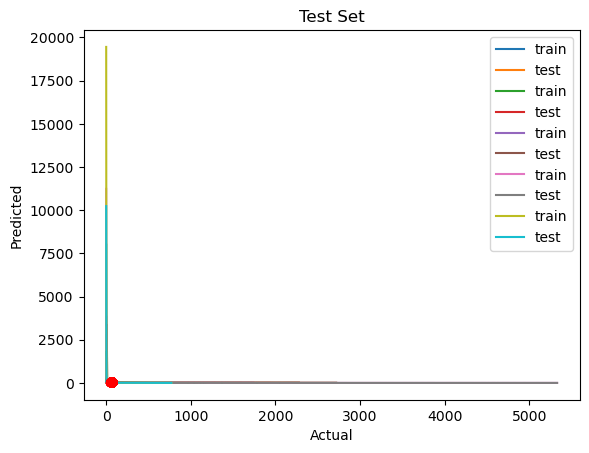

In [31]:
solar_panels = ["PHL6621","CRS0018","QCL0182","QCL0201","QCL0346"]
regressors={}
for pv in solar_panels:
    #combined_data = sml.get_csv(pv)
    #combined_df = sml.preprocessing(combined_data)
    #display(combined_df)
    dnn = sml.deep_learning_load(combined_df, pv)
    regressors[pv] = {'NOCT':dnn['noct'], 'R_SQUARE':dnn['r_square_test'], 'MEAN_SQUARE_ERROR':dnn['mse_test']}
regressor_dataframe = pd.DataFrame.from_dict(regressors, orient='index')
regressor_dataframe = regressor_dataframe.rename_axis("module_id").reset_index()
regressor_dataframe.to_csv('metrics/deep_learning.csv', sep=',')

In [8]:
regressor_dataframe

,NOCT,R_SQUARE,MEAN_SQUARE_ERROR
PHL6621,45.96,0.791637,4.717675
CRS0018,44.17,0.642892,8.085492
QCL0182,49.07,0.842690,3.561749
QCL0201,50.84,0.816115,4.163451
QCL0346,47.33,0.820195,4.071074


In [40]:
import pandas as pd
import numpy as np
from datetime import datetime
import hvplot.pandas
from pathlib import Path
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.anova import anova_lm
import matplotlib.pyplot as plt  # To visualize
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_score

In [47]:
# Declaring global variables
RQUARE_CUTOFF = 0.7 # Min R-square value set to 75%
SIGMA = 2  # Number of standard deviation. 2-sigma

In [3]:
# exponential smoothing function
def exponential_smoothing(series, alpha):
    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1-alpha) * result[n-1])
    return result

In [4]:
# Plot exponential smoothing
def plot_exponential_smoothing(series, alphas):
    plt.figure(figsize=(17,8))
    for alpha in alphas:
        plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
    plt.plot(series.values, "c", label="Actual")
    plt.legend(loc="best")
    plt.axis("tight")
    plt.title("Exponential Smoothing")
    plt.grid(True)

In [5]:
# function that locates and remove outliers using interquartile range
def drop_outlier(data, variable):
    # find q1 and q3 values
    q1, q3 = np.percentile(sorted(data[variable]), [25, 75])
 
    # compute IQR
    iqr = q3 - q1
 
    # find lower and upper bounds
    lower_bound = q1 - (1.50 * iqr)
    upper_bound = q3 + (1.50 * iqr)
    
    # dropping outliers
    no_outliers = data.drop(data[(data[variable] <= lower_bound) | (data[variable] >= upper_bound)].index)
    #no_outliers = data.drop(data[data[variable] <= lower_bound], inplace=True)
    return no_outliers

In [6]:
# function that locates and remove outliers using standard deviation
def std_outliers(data, variable):
    mean = data[variable].mean()
    #residual = data[variable] - avg
    #std = residual.std()
    std = data[variable].std()
    #outliers = (np.abs(residual) > std * sigma)
    no_outliers = data.drop(data[(np.abs(data[variable] - mean) > std * SIGMA)].index)
    return no_outliers

In [7]:
# Function that takes a directory pathname and returns the list of csv files in that directory
def get_csvfiles(pathname):
    dir_path = Path(pathname)
    csvfile = []
    p = dir_path.glob('*.csv')
    files = [x for x in p if x.is_file()]
    for f in files:
        for part in f.parts:
            if not part.startswith('.') and part.endswith('.csv'):
                csvfile.append(part)
    return csvfile

In [8]:
# This function takes the absolute or relative pathname to the data directory,
# Then create and return a list of dataframes
def get_dataframes(dir_pathname):
    dataframes = []
    csv_filenames = get_csvfiles(dir_pathname)
    for file in csv_filenames:
        table_name = file.split('.')[0]
        df = pd.read_csv(Path(dir_pathname + file), header=1, usecols = ['TIMESTAMP', 'AirTemp_Avg', 'Irradiance_Pyr_NOCT_Avg', 'Wind_speed', 'Wind_direction', 'NOCT_Mod1_Cent1_Avg', 'NOCT_Mod1_Cent2_Avg'])
        #df = pd.read_csv(Path(dir_pathname + file))
        dataframes.append(df)
    return dataframes

In [9]:
# This function removes outliers that lie more than n_std standard deviations away from the mean
# It takes the dataframe (df), the list of columns (columns), and the number of standard deviations (n_std)
def remove_outliers(df,columns,n_std):
    for col in columns:        
        mean = df[col].mean()
        sd = df[col].std()
        
        df = df[(df[col] <= mean+(n_std*sd))]
        
    return df

In [10]:
# This function takes a dataframe and split into a list of dataframes to obtain daily data

def split_df(df):
    df_lst = []  # declare the list to return
    df['date'] = df['date'].astype(str)  # convert date column to string
    dates = df['date'].unique().tolist() # store unique dates into a list
    for Date in dates:
        df_lst.append(df.loc[df['date'].str.contains(Date)])   # create and append df of rows that contain the date string
        
    return df_lst

In [11]:
# Determine multicollinearity among independent variables by computing VIF
# VIFs between 1 and 5 suggest that there is a moderate correlation, 
# but it is not severe enough to warrant corrective measures. 
# VIFs greater than 5 represent critical levels of multicollinearity where the coefficients are poorly estimated, 
# and the p-values are questionable.

# the independent variables set
#X = noct_csv[['AirTemp_Avg', 'Wind_speed', 'Irradiance_Pyr_NOCT_Avg']]

# The parameters are the dataframe and the sliced dataframe of X-columns
def get_VIF(df, X_df):
    # VIF dataframe
    vif_data = pd.DataFrame()
    vif_data["feature"] = X_df.columns  # sliced dataframe of X-columns passed as parameter
    
    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X_df.values, i)
                          for i in range(len(X_df.columns))]
  
    return vif_data

In [12]:
# Regression Model summary with ANOVA

def get_anova(df, X, Y):
    #X = noct_csv[['AirTemp_Avg', 'Wind_speed','Irradiance_Pyr_NOCT_Avg']]
    # X = noct_csv[['Wind_speed','Irradiance_Pyr_NOCT_Avg']]
    #Y = noct_csv['T_RISE'] = noct_csv.loc[:, ['NOCT_Mod2_Cent1_Avg','NOCT_Mod2_Cent2_Avg']].mean(axis=1) - noct_csv['AirTemp_Avg']

    model = ols("Y ~ X", noct_csv).fit()

    # Print the summary
    #print(model.summary())

    # Peform analysis of variance on fitted linear model
    anova_results = anova_lm(model)

    #print('\nANOVA results')
    return anova_results

In [13]:
directory_pathname = "Data/Control_Module/"
dataframes = get_dataframes(directory_pathname)
combined_data = pd.concat(dataframes, axis=0, join='inner')
combined_data

C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\ipykernel_launcher.py:2: DtypeWarning: Columns (2,3,4,6,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  


,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
0,TS,NaN,NaN,Deg,NaN,Deg C,Deg C
1,NaN,Avg,WVc,WVc,Avg,Avg,Avg
2,4/10/2022 7:18,20.6,1.33,99.99999,180.2989,NAN,NAN
3,4/10/2022 7:18,20.6,1.11,111,180.2989,NAN,NAN
4,4/10/2022 7:18,20.6,1.09,116,180.2989,NAN,NAN
...,...,...,...,...,...,...,...
173262,4/11/2023 1:15,21.9,0.22,197.0,0.0,17.16,17.15
173263,4/11/2023 1:15,21.9,0.17,198.0,0.0,17.17,17.15
173264,4/11/2023 1:15,21.8,0.16,191.0,0.0,17.17,17.14
173265,4/11/2023 1:15,21.8,0.19,187.0,0.0,17.16,17.11


In [14]:
# Drop rows.
# Could also use labels: noct_csv.drop(labels=[0,1], axis=0)
combined_data.drop(combined_data.index[[0,1]], axis=0, inplace=True)
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
2,4/10/2022 7:18,20.6,1.33,99.99999,180.2989,NAN,NAN
3,4/10/2022 7:18,20.6,1.11,111,180.2989,NAN,NAN
4,4/10/2022 7:18,20.6,1.09,116,180.2989,NAN,NAN
5,4/10/2022 7:18,20.6,1.22,130,181.2841,NAN,NAN
6,4/10/2022 7:18,20.6,0.6,126,181.2841,NAN,NAN
...,...,...,...,...,...,...,...
173262,4/11/2023 1:15,21.9,0.22,197.0,0.0,17.16,17.15
173263,4/11/2023 1:15,21.9,0.17,198.0,0.0,17.17,17.15
173264,4/11/2023 1:15,21.8,0.16,191.0,0.0,17.17,17.14
173265,4/11/2023 1:15,21.8,0.19,187.0,0.0,17.16,17.11


In [15]:
# Change "NAN" values to NaN so they can be dropped
combined_data.replace("NAN", np.NaN, inplace=True)

In [16]:
# Drop the previous index and reset 
combined_data.reset_index(drop=True, inplace=True)
combined_data.head()

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
0,4/10/2022 7:18,20.6,1.33,99.99999,180.2989,NaN,NaN
1,4/10/2022 7:18,20.6,1.11,111,180.2989,NaN,NaN
2,4/10/2022 7:18,20.6,1.09,116,180.2989,NaN,NaN
3,4/10/2022 7:18,20.6,1.22,130,181.2841,NaN,NaN
4,4/10/2022 7:18,20.6,0.6,126,181.2841,NaN,NaN


In [17]:
# Check data types
combined_data.dtypes

TIMESTAMP                  object
AirTemp_Avg                object
Wind_speed                 object
Wind_direction             object
Irradiance_Pyr_NOCT_Avg    object
NOCT_Mod1_Cent1_Avg        object
NOCT_Mod1_Cent2_Avg        object
dtype: object

In [18]:
# Convert numeric columns to float
data = ['AirTemp_Avg', 'Irradiance_Pyr_NOCT_Avg', 'Wind_speed', 'Wind_direction', 'NOCT_Mod1_Cent1_Avg', 'NOCT_Mod1_Cent2_Avg']
for col in data:
    combined_data[col] = combined_data[col].astype('float')
combined_data.dtypes

TIMESTAMP                   object
AirTemp_Avg                float64
Wind_speed                 float64
Wind_direction             float64
Irradiance_Pyr_NOCT_Avg    float64
NOCT_Mod1_Cent1_Avg        float64
NOCT_Mod1_Cent2_Avg        float64
dtype: object

In [19]:
# Delete all data outside the range 0.25 < wind speed < 1.75
indexWS = combined_data[ (combined_data['Wind_speed']<0.25) | (combined_data['Wind_speed']>1.75) ].index  # get index of the desired rows to drop
combined_data.drop(indexWS, axis=0, inplace=True)
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
0,4/10/2022 7:18,20.6,1.33,99.99999,180.2989,NaN,NaN
1,4/10/2022 7:18,20.6,1.11,111.00000,180.2989,NaN,NaN
2,4/10/2022 7:18,20.6,1.09,116.00000,180.2989,NaN,NaN
3,4/10/2022 7:18,20.6,1.22,130.00000,181.2841,NaN,NaN
4,4/10/2022 7:18,20.6,0.60,126.00000,181.2841,NaN,NaN
...,...,...,...,...,...,...,...
4080322,4/11/2023 1:14,21.9,0.33,245.00000,0.0000,17.34,17.30
4080323,4/11/2023 1:14,21.9,0.35,251.00000,0.0000,17.33,17.29
4080324,4/11/2023 1:14,21.9,0.34,251.00000,0.0000,17.32,17.31
4080325,4/11/2023 1:14,21.9,0.28,248.00000,0.0000,17.30,17.29


In [20]:
# Delete all Wind Direction data within 290 - 250, and 69 - 110
indexWD = combined_data[ ((combined_data['Wind_direction']>250) & (combined_data['Wind_direction']<=290)) | ((combined_data['Wind_direction']>69.99) & (combined_data['Wind_direction']<=110)) ].index  
combined_data.drop(indexWD, axis=0, inplace=True)
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
1,4/10/2022 7:18,20.6,1.11,111.0,180.2989,NaN,NaN
2,4/10/2022 7:18,20.6,1.09,116.0,180.2989,NaN,NaN
3,4/10/2022 7:18,20.6,1.22,130.0,181.2841,NaN,NaN
4,4/10/2022 7:18,20.6,0.60,126.0,181.2841,NaN,NaN
7,4/10/2022 7:19,20.6,1.15,111.0,182.2693,NaN,NaN
...,...,...,...,...,...,...,...
4080315,4/11/2023 1:13,22.0,0.38,249.0,0.0000,17.38,17.35
4080321,4/11/2023 1:14,21.9,0.40,248.0,0.0000,17.32,17.29
4080322,4/11/2023 1:14,21.9,0.33,245.0,0.0000,17.34,17.30
4080325,4/11/2023 1:14,21.9,0.28,248.0,0.0000,17.30,17.29


In [21]:
# Delete all Irradiance data below 400 and above 1100
indexIrr = combined_data[ (combined_data['Irradiance_Pyr_NOCT_Avg']<400) | (combined_data['Irradiance_Pyr_NOCT_Avg']>1100) ].index
combined_data.drop(indexIrr, axis=0, inplace=True)
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg
651,4/10/2022 8:12,23.1,1.52,154.0,400.2790,NaN,NaN
652,4/10/2022 8:12,23.1,1.10,133.0,400.7714,NaN,NaN
653,4/10/2022 8:12,23.1,0.81,119.0,400.7714,NaN,NaN
655,4/10/2022 8:13,23.1,1.28,147.0,401.7561,NaN,NaN
656,4/10/2022 8:13,23.1,1.07,157.0,401.7561,NaN,NaN
...,...,...,...,...,...,...,...
4074193,4/10/2023 16:42,37.3,1.61,169.0,401.7508,48.89,49.43
4074194,4/10/2023 16:42,37.3,1.21,207.0,401.2567,48.93,49.51
4074195,4/10/2023 16:43,37.3,1.11,172.0,401.2567,49.07,49.60
4074197,4/10/2023 16:43,37.3,0.69,188.0,400.7625,49.26,49.71


In [22]:
# Create the T-rise column
combined_data['T_RISE'] = combined_data[['NOCT_Mod1_Cent1_Avg','NOCT_Mod1_Cent2_Avg']].mean(axis=1) - combined_data['AirTemp_Avg']
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg,T_RISE
651,4/10/2022 8:12,23.1,1.52,154.0,400.2790,NaN,NaN,NaN
652,4/10/2022 8:12,23.1,1.10,133.0,400.7714,NaN,NaN,NaN
653,4/10/2022 8:12,23.1,0.81,119.0,400.7714,NaN,NaN,NaN
655,4/10/2022 8:13,23.1,1.28,147.0,401.7561,NaN,NaN,NaN
656,4/10/2022 8:13,23.1,1.07,157.0,401.7561,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
4074193,4/10/2023 16:42,37.3,1.61,169.0,401.7508,48.89,49.43,11.860
4074194,4/10/2023 16:42,37.3,1.21,207.0,401.2567,48.93,49.51,11.920
4074195,4/10/2023 16:43,37.3,1.11,172.0,401.2567,49.07,49.60,12.035
4074197,4/10/2023 16:43,37.3,0.69,188.0,400.7625,49.26,49.71,12.185


In [23]:
combined_data["Date"] = pd.to_datetime(combined_data["TIMESTAMP"])
display(combined_data.dtypes)
display(combined_data.head(5))

TIMESTAMP                          object
AirTemp_Avg                       float64
Wind_speed                        float64
Wind_direction                    float64
Irradiance_Pyr_NOCT_Avg           float64
NOCT_Mod1_Cent1_Avg               float64
NOCT_Mod1_Cent2_Avg               float64
T_RISE                            float64
Date                       datetime64[ns]
dtype: object

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg,T_RISE,Date
651,4/10/2022 8:12,23.1,1.52,154.0,400.2790,NaN,NaN,NaN,2022-04-10 08:12:00
652,4/10/2022 8:12,23.1,1.10,133.0,400.7714,NaN,NaN,NaN,2022-04-10 08:12:00
653,4/10/2022 8:12,23.1,0.81,119.0,400.7714,NaN,NaN,NaN,2022-04-10 08:12:00
655,4/10/2022 8:13,23.1,1.28,147.0,401.7561,NaN,NaN,NaN,2022-04-10 08:13:00
656,4/10/2022 8:13,23.1,1.07,157.0,401.7561,NaN,NaN,NaN,2022-04-10 08:13:00


In [24]:
combined_data["date"] = combined_data["Date"].dt.date
combined_data["year"] = combined_data["Date"].dt.year
combined_data["month"] = combined_data["Date"].dt.month
combined_data["day"] = combined_data["Date"].dt.day
combined_data["hour"] = combined_data["Date"].dt.hour
combined_data["minute"] = combined_data["Date"].dt.minute
#noct_csv.drop("TIMESTAMP", axis=1, inplace=True)
combined_data.head(5)

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg,T_RISE,Date,date,year,month,day,hour,minute
651,4/10/2022 8:12,23.1,1.52,154.0,400.2790,NaN,NaN,NaN,2022-04-10 08:12:00,2022-04-10,2022.0,4.0,10.0,8.0,12.0
652,4/10/2022 8:12,23.1,1.10,133.0,400.7714,NaN,NaN,NaN,2022-04-10 08:12:00,2022-04-10,2022.0,4.0,10.0,8.0,12.0
653,4/10/2022 8:12,23.1,0.81,119.0,400.7714,NaN,NaN,NaN,2022-04-10 08:12:00,2022-04-10,2022.0,4.0,10.0,8.0,12.0
655,4/10/2022 8:13,23.1,1.28,147.0,401.7561,NaN,NaN,NaN,2022-04-10 08:13:00,2022-04-10,2022.0,4.0,10.0,8.0,13.0
656,4/10/2022 8:13,23.1,1.07,157.0,401.7561,NaN,NaN,NaN,2022-04-10 08:13:00,2022-04-10,2022.0,4.0,10.0,8.0,13.0


In [25]:
combined_data.dropna(axis=0, how='any', inplace=True)
combined_data.sort_values(by=['Date'])
combined_data

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg,T_RISE,Date,date,year,month,day,hour,minute
194512,4/25/2022 11:27,30.3,1.48,336.0,964.9658,47.10,46.15,16.325,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194514,4/25/2022 11:27,30.3,1.48,18.0,964.9658,47.81,46.90,17.055,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194517,4/25/2022 11:27,30.4,1.00,13.0,962.9938,48.82,47.76,17.890,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194525,4/25/2022 11:28,30.4,1.71,32.0,961.0275,50.72,49.66,19.790,2022-04-25 11:28:00,2022-04-25,2022.0,4.0,25.0,11.0,28.0
194527,4/25/2022 11:28,30.4,1.60,357.0,962.9938,51.45,50.06,20.355,2022-04-25 11:28:00,2022-04-25,2022.0,4.0,25.0,11.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4074193,4/10/2023 16:42,37.3,1.61,169.0,401.7508,48.89,49.43,11.860,2023-04-10 16:42:00,2023-04-10,2023.0,4.0,10.0,16.0,42.0
4074194,4/10/2023 16:42,37.3,1.21,207.0,401.2567,48.93,49.51,11.920,2023-04-10 16:42:00,2023-04-10,2023.0,4.0,10.0,16.0,42.0
4074195,4/10/2023 16:43,37.3,1.11,172.0,401.2567,49.07,49.60,12.035,2023-04-10 16:43:00,2023-04-10,2023.0,4.0,10.0,16.0,43.0
4074197,4/10/2023 16:43,37.3,0.69,188.0,400.7625,49.26,49.71,12.185,2023-04-10 16:43:00,2023-04-10,2023.0,4.0,10.0,16.0,43.0


In [26]:
# Slice data between 11am and 1pm
indexHour = combined_data[ ((combined_data['hour']<11) | (combined_data['hour']>13))].index
combined_data.drop(indexHour, axis=0, inplace=True)

In [27]:
# Split the data into a list of daily data
noct_dataframes = split_df(combined_data)
noct_dataframes[0]

,TIMESTAMP,AirTemp_Avg,Wind_speed,Wind_direction,Irradiance_Pyr_NOCT_Avg,NOCT_Mod1_Cent1_Avg,NOCT_Mod1_Cent2_Avg,T_RISE,Date,date,year,month,day,hour,minute
194512,4/25/2022 11:27,30.3,1.48,336.00000,964.9658,47.10,46.15,16.325,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194514,4/25/2022 11:27,30.3,1.48,18.00000,964.9658,47.81,46.90,17.055,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194517,4/25/2022 11:27,30.4,1.00,13.00000,962.9938,48.82,47.76,17.890,2022-04-25 11:27:00,2022-04-25,2022.0,4.0,25.0,11.0,27.0
194525,4/25/2022 11:28,30.4,1.71,32.00000,961.0275,50.72,49.66,19.790,2022-04-25 11:28:00,2022-04-25,2022.0,4.0,25.0,11.0,28.0
194527,4/25/2022 11:28,30.4,1.60,357.00000,962.9938,51.45,50.06,20.355,2022-04-25 11:28:00,2022-04-25,2022.0,4.0,25.0,11.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196340,4/25/2022 13:59,33.6,0.90,36.99999,860.2892,74.51,77.25,42.280,2022-04-25 13:59:00,2022-04-25,2022.0,4.0,25.0,13.0,59.0
196341,4/25/2022 13:59,33.6,1.32,56.00000,859.7980,74.55,77.27,42.310,2022-04-25 13:59:00,2022-04-25,2022.0,4.0,25.0,13.0,59.0
196343,4/25/2022 13:59,33.6,0.32,115.00000,859.3066,74.79,77.34,42.465,2022-04-25 13:59:00,2022-04-25,2022.0,4.0,25.0,13.0,59.0
196344,4/25/2022 13:59,33.6,0.30,64.00000,858.3240,75.46,77.43,42.845,2022-04-25 13:59:00,2022-04-25,2022.0,4.0,25.0,13.0,59.0


In [28]:
# Aggregate data by minutes
daily_noct = []
for dataframe in noct_dataframes:
    noct_df = dataframe[["date", "hour","minute", "month", "AirTemp_Avg", "Wind_speed", "Irradiance_Pyr_NOCT_Avg", "T_RISE"]]
    noct_df_agg = noct_df.groupby(["date", "hour", "minute"]).mean()
    noct_df_agg.reset_index(inplace=True)
    daily_noct.append(noct_df_agg)

daily_noct[0]

,date,hour,minute,month,AirTemp_Avg,Wind_speed,Irradiance_Pyr_NOCT_Avg,T_RISE
0,2022-04-25,11.0,27.0,4.0,30.333333,1.320000,964.308467,17.090000
1,2022-04-25,11.0,28.0,4.0,30.400000,1.112000,962.502220,20.648000
2,2022-04-25,11.0,29.0,4.0,30.400000,1.035000,965.446800,23.910000
3,2022-04-25,11.0,30.0,4.0,30.337500,1.133750,964.955263,26.224375
4,2022-04-25,11.0,31.0,4.0,30.250000,1.143333,964.790267,28.151667
...,...,...,...,...,...,...,...,...
140,2022-04-25,13.0,55.0,4.0,33.577778,0.816667,868.976544,42.996667
141,2022-04-25,13.0,56.0,4.0,33.663636,0.928182,866.862718,42.837727
142,2022-04-25,13.0,57.0,4.0,33.700000,0.701000,864.611730,43.256500
143,2022-04-25,13.0,58.0,4.0,33.700000,1.374444,861.157867,42.717222


In [29]:
len(daily_noct)

217

In [30]:
# Cleaning ambient temperatures
# If min amb temp around 35, delete data where (max - min) amb temp are above 5 degC
# Otherwise, Delete all Ambient Temperature data below 5 degC and above 35 degC if max Tamb < 35
for noct in daily_noct:
    indexShift = noct[ (noct['AirTemp_Avg'] - noct['AirTemp_Avg'].shift(1)) < 0 ].index
    noct.drop(indexShift, axis=0, inplace=True)
    if noct['AirTemp_Avg'].min() >= 35:
        while (noct['AirTemp_Avg'].max() - noct['AirTemp_Avg'].min()) > 5:
            noct.drop(noct[(noct['AirTemp_Avg'] == noct['AirTemp_Avg'].max()) | (noct["AirTemp_Avg"] == noct['AirTemp_Avg'].min())].index, axis=0, inplace=True)
    else:
        indexTamb = noct[ ((noct['AirTemp_Avg']<5) & (noct['AirTemp_Avg']>35))].index
        noct.drop(indexTamb, axis=0, inplace=True)
    #print(f"{noct.index[0][0]}: \n{noct}")

In [31]:
# Indice 5 is known to have only afternoon data. This should be removed
daily_noct[5]

,date,hour,minute,month,AirTemp_Avg,Wind_speed,Irradiance_Pyr_NOCT_Avg,T_RISE
0,2022-05-28,13.0,4.0,5.0,36.800000,1.510000,909.629200,30.990000
1,2022-05-28,13.0,5.0,5.0,36.900000,1.203750,905.740338,30.746250
2,2022-05-28,13.0,8.0,5.0,37.400000,1.530000,853.339050,27.485000
5,2022-05-28,13.0,12.0,5.0,37.000000,1.570000,857.764300,26.752500
7,2022-05-28,13.0,14.0,5.0,37.000000,1.265714,940.994371,27.135000
10,2022-05-28,13.0,17.0,5.0,36.800000,1.100000,927.645633,28.064444
14,2022-05-28,13.0,21.0,5.0,36.600000,1.416667,912.057267,29.286667
15,2022-05-28,13.0,22.0,5.0,36.766667,1.116667,915.924550,29.443333
16,2022-05-28,13.0,23.0,5.0,36.837500,1.195000,916.993575,29.397500
17,2022-05-28,13.0,24.0,5.0,36.900000,1.550000,912.549300,30.075000


In [32]:
# We want to delete all the data which do not have points before and after noon
to_remove = []   # This will hold the indices of the dataframe list to be removed
for i, noct in enumerate(daily_noct):
    am = False
    pm = False
    if noct['hour'].min() == 11:
        am = True
    if noct['hour'].max() in [12,13]:
        pm = True
    if (am == False or pm == False):
        to_remove.append(i)
# Sort the indice of dataframes to drop
# By starting from higher to lower indices, we're guaranteed that the indices on the dataframe will remain unmodified while deleting
for x in sorted(to_remove, reverse=True):
    del daily_noct[x]

In [33]:
# Checking that the previous indice 5 was effectively deleted.
daily_noct[5]

,date,hour,minute,month,AirTemp_Avg,Wind_speed,Irradiance_Pyr_NOCT_Avg,T_RISE
0,2022-05-29,11.0,0.0,5.0,31.260000,1.298000,858.525660,30.848000
1,2022-05-29,11.0,1.0,5.0,31.300000,0.850000,860.797300,30.890000
6,2022-05-29,11.0,6.0,5.0,30.157143,1.278571,867.216843,32.602857
7,2022-05-29,11.0,7.0,5.0,30.275000,0.620000,868.756588,32.151250
8,2022-05-29,11.0,8.0,5.0,30.344444,0.931111,868.858222,30.978333
...,...,...,...,...,...,...,...,...
133,2022-05-29,13.0,43.0,5.0,33.300000,0.920000,838.569100,25.030000
134,2022-05-29,13.0,44.0,5.0,33.300000,1.316667,838.247367,24.568333
138,2022-05-29,13.0,49.0,5.0,33.400000,1.296000,827.607380,24.131000
141,2022-05-29,13.0,52.0,5.0,33.400000,1.240000,829.431850,23.892500


In [34]:
for noct in daily_noct:
    noct.set_index(['date'], inplace=True)

In [35]:
daily_noct[1].index[0]

'2022-04-26'

In [37]:
'''
for noct in daily_noct:
    noct.set_index(['date','hour','minute'], inplace=True)
daily_noct[0].index
'''

"\nfor noct in daily_noct:\n    noct.set_index(['date','hour','minute'], inplace=True)\ndaily_noct[0].index\n"

In [ ]:
# Combining the list of dataframes into a single one
#all_noct = pd.concat(daily_noct, axis=0, join='inner')
#all_noct

In [ ]:
# Set the dependent and independent variables list for the model.
# Simple linear regression: T_RISE = f(Irradiance)
model = LinearRegression(fit_intercept=True)
model_dict = {}
for noct in daily_noct:
    x = noct.loc[:, "Irradiance_Pyr_NOCT_Avg"].values.reshape(-1, 1)  # values converts it into a numpy array
    y = noct.loc[:, "T_RISE"].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
    model.fit(x, y)
    noct['predicted'] = model.predict(x)
    noct_est = 20 + model.intercept_ + model.coef_ * 800
    plot = noct.hvplot.scatter(x='Irradiance_Pyr_NOCT_Avg',
                               y='T_RISE',
                               xlabel = "Irradiance",
                               ylabel="Temperature Rise",
                               title=f"Temp Rise vs. Irradiance for {noct.index[0]}",
                               color="blue"
                               ).opts(yformatter='%.0f') * noct.hvplot.line(x='Irradiance_Pyr_NOCT_Avg',
                                                                                       y='predicted',
                                                                                       color='red')
    model_dict[noct.index[0]] = {"model": model, "plot": plot, "intercept": round(float(model.intercept_),2), "slope": round(float(model.coef_),2), "noct": noct_est, "r_square": round(float(model.score(x, y)),2)}


In [41]:
# Set the dependent and independent variables list for the model.
# Multiple linear regression: T_RISE = f(Irradiance, Wind_speed)
model = LinearRegression(fit_intercept=True)
full_model_dict = {}

for noct in daily_noct:
    X = noct[['Wind_speed','Irradiance_Pyr_NOCT_Avg']]
    Y = noct['T_RISE']
    X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=11)
    linear_regression = LinearRegression()
    linear_regression.fit(X=X_train, y=y_train)
    LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
    #model = ols("Y ~ X", noct).fit()
    #anova_results = anova_lm(model)
    #summary = model.summary()
    #results = model.params
    #r_square = model.rsquared
    noct_est = 20 + linear_regression.intercept_ + linear_regression.coef_[0] + linear_regression.coef_[1] * 800
    predicted = linear_regression.predict(X_test)
    expected = y_test
    r_square = metrics.r2_score(expected, predicted)
    Tamb_avg = float(noct["AirTemp_Avg"].mean())
    WS_avg = float(noct["Wind_speed"].mean())
    #full_model_dict[noct.index[0]] = {"model": model, "summary": summary, "parameters": results, "noct": noct_est, "r_square": r_square, "ambient_temp": Tamb_avg, "wind_speed": WS_avg, "ws_correction": int(results[1])}
    full_model_dict[noct.index[0]] = {"model": linear_regression, "noct": noct_est, "r_square": r_square, "ambient_temp": Tamb_avg, "wind_speed": WS_avg, "ws_correction": int(linear_regression.coef_[0])}

C:\Users\Kuitche\anaconda3\envs\dev\lib\site-packages\sklearn\metrics\_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [255]:
# Display Simple Linear Regression Results
for key in model_dict:
    #display(model_dict[key]['ws_correction'])
    #display(model_dict[key]['ambient_temp'])
    #display(model_dict[key]['wind_speed'])
    display(model_dict[key]['noct'])
    display(model_dict[key]['r_square'])
    print(" ")
    display(model_dict[key]['plot'])


array([[62.11805771]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[57.80257884]])

0.15

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.10587697]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.62045061]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.85443019]])

0.5

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.83006248]])

0.44

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.09595918]])

0.11

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.84489064]])

0.14

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.3189101]])

0.28

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.55751308]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.49226985]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.99253267]])

0.32

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.76200571]])

0.38

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.89955054]])

0.04

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.75031785]])

0.12

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.52754938]])

0.53

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.39907476]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.29831412]])

0.15

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.6996895]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.83233873]])

0.11

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.3229666]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.42793256]])

0.08

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.99124496]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.82119302]])

0.24

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.13234471]])

0.37

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.35860546]])

0.18

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.35347333]])

0.16

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.88700273]])

0.07

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.75761502]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.69357736]])

0.38

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.11533504]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.7307079]])

0.36

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.88557599]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.60566457]])

0.23

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.85700704]])

0.18

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.0202459]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.79604253]])

0.56

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.46976932]])

0.63

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.66249214]])

0.25

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.41007065]])

0.55

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.48925175]])

0.15

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.99446153]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.98463663]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.08125524]])

0.54

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.60498066]])

0.52

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.39125043]])

0.29

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.06332174]])

0.07

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.32653961]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.61415818]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.30485685]])

0.52

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.89625223]])

0.47

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.0683272]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.44535102]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.36364653]])

0.08

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.72741084]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.02560245]])

0.66

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.34017261]])

0.33

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.92958186]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.05233278]])

0.65

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.60861289]])

0.59

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.24207651]])

0.84

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.60321188]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.93184844]])

0.36

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.94897333]])

0.28

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.34298567]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.15490695]])

0.09

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.51157014]])

0.8

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.39490237]])

0.23

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.99956758]])

0.38

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.86348674]])

0.1

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.30320191]])

0.08

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.50052251]])

0.24

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.85869618]])

0.02

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.54974639]])

0.06

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.23928499]])

0.08

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.63427859]])

0.12

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.83610069]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.28752955]])

0.09

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.66159969]])

0.7

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.68127938]])

0.55

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.16321034]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.64088601]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.37308866]])

0.3

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.78443766]])

0.07

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.12836016]])

0.23

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.16484562]])

0.24

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.69218471]])

0.55

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.3373451]])

0.59

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.61661255]])

0.13

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[40.27952551]])

0.27

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.02897469]])

0.23

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.1921556]])

0.77

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.30592176]])

0.02

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.64593683]])

0.2

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.01705342]])

0.02

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.61616834]])

0.47

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.10335136]])

0.38

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.66044014]])

0.14

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.28942186]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.48477602]])

0.71

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.82279368]])

0.18

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[41.60559117]])

0.35

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[40.16798236]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.46733719]])

0.27

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[53.29596958]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.0530595]])

0.2

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.06999967]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.58311748]])

0.6

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.9484437]])

0.35

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.94402657]])

0.51

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.36518917]])

0.44

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.24507048]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.12738822]])

0.54

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.66402737]])

0.58

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.29569307]])

0.32

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.979263]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.12136393]])

0.68

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.93585125]])

0.73

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.57025522]])

0.27

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.6349195]])

0.64

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.42333603]])

0.3

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.02457761]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.49190082]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.78880304]])

0.46

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[40.9771255]])

0.33

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.09792683]])

0.02

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.31446869]])

0.34

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[39.74943881]])

0.51

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.68564151]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.34661502]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.96248098]])

0.49

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.41324762]])

0.53

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[38.73624802]])

0.44

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.05611852]])

0.16

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.2042085]])

0.43

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.87477722]])

0.05

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.76844653]])

0.51

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.88570806]])

0.32

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.22220805]])

0.24

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[39.92131142]])

0.54

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.80983458]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.14122581]])

0.67

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.50701457]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.31813588]])

0.31

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.14696184]])

0.45

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[53.3894091]])

0.45

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.09335263]])

0.21

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.98273158]])

0.36

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.65201361]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.83089605]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.83667589]])

0.02

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.10141356]])

0.34

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[40.76832549]])

0.22

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.07339523]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.15262184]])

0.04

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.20696718]])

0.06

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.67515991]])

0.35

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[27.95907837]])

0.87

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.09301148]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.45042429]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.67858912]])

0.27

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.56248465]])

0.62

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.35092529]])

0.56

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.31148743]])

0.73

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[31.77933371]])

0.57

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.84451868]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.68002882]])

0.39

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.70733741]])

0.2

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.34891824]])

0.48

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.71575317]])

0.69

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.00532975]])

0.13

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[38.06482526]])

0.65

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.02995609]])

0.74

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.01462525]])

0.68

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.73367695]])

0.29

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.24634913]])

0.17

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[53.13576964]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.49052723]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[41.53357536]])

0.11

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[39.77292766]])

0.24

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[40.5530116]])

0.13

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[47.81130244]])

0.57

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[38.38188342]])

0.08

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.12598267]])

0.12

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.31453187]])

0.33

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.7073976]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.90894249]])

0.36

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[37.41269773]])

0.56

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.55434139]])

0.73

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.94163191]])

0.18

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.51781168]])

0.31

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[46.70948457]])

0.01

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.03325296]])

0.13

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.21811465]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.47886207]])

0.04

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[52.31272436]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[50.40315024]])

0.0

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[43.25751071]])

0.26

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[51.16123155]])

0.18

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[55.78411298]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.13208795]])

0.4

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[45.84938554]])

0.1

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.10026603]])

0.04

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[42.7696961]])

0.2

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.83334432]])

0.42

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[49.20132745]])

0.47

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.68273763]])

0.81

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[44.42914904]])

0.41

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

array([[48.58644539]])

0.03

:Overlay
   .Scatter.I :Scatter   [Irradiance_Pyr_NOCT_Avg]   (T_RISE)
   .Curve.I   :Curve   [Irradiance_Pyr_NOCT_Avg]   (predicted)

In [48]:
#d = pd.DataFrame(data=full_model_dict, index = full_model_dict.keys(), columns=full_model_dict.keys().keys() )
# use the orient parameter to transpose
noct_dataframe = pd.DataFrame.from_dict(full_model_dict, orient='index')
noct_dataframe.drop(noct_dataframe[noct_dataframe['r_square']  <= RQUARE_CUTOFF].index, inplace=True)
#noct_dataframe.drop(columns=['model', 'summary', 'parameters'], axis=1, inplace=True)
noct_dataframe.drop(columns=['model'], axis=1, inplace=True)
noct_dataframe['day'] = noct_dataframe.index
noct_dataframe

,noct,r_square,ambient_temp,wind_speed,ws_correction,day
2022-06-11,46.670690,0.717899,42.585950,1.090407,-3,2022-06-11
2022-07-21,46.560116,0.723808,38.293318,0.987974,0,2022-07-21
2022-08-09,47.853155,0.707934,30.970649,0.808911,-3,2022-08-09
2022-08-12,48.677555,0.710858,39.488278,1.144081,-4,2022-08-12
2022-08-14,48.302459,0.911080,34.710048,0.901725,1,2022-08-14
2022-08-20,45.361440,0.712032,33.681408,1.245172,0,2022-08-20
2022-09-01,43.412028,0.767867,38.982661,0.974825,-1,2022-09-01
2022-10-16,45.792066,0.747708,23.208597,0.788035,2,2022-10-16
2022-11-02,42.316859,0.782275,25.229688,0.936146,4,2022-11-02
2022-11-04,47.777605,0.850779,16.606092,0.840771,-1,2022-11-04


In [253]:
noct_dataframe.shape

(17, 6)

In [87]:
# Locate and drop outliers
#noct_dataframe_no_outliers = drop_outlier(noct_dataframe, 'noct')
noct_dataframe_no_outliers = std_outliers(noct_dataframe, 'noct')
noct_dataframe_no_outliers["month"] = pd.to_datetime(noct_dataframe_no_outliers["day"]).dt.month
noct_dataframe_no_outliers

,noct,r_square,ambient_temp,wind_speed,ws_correction,day,month
2022-08-12,48.723925,0.717749,39.488278,1.144081,-4,2022-08-12,8
2022-08-14,48.329316,0.845216,34.710048,0.901725,1,2022-08-14,8
2022-08-20,45.628597,0.798267,33.681408,1.245172,0,2022-08-20,8
2022-09-01,43.744694,0.710451,38.982661,0.974825,-1,2022-09-01,9
2022-11-04,47.633257,0.748463,16.606092,0.840771,0,2022-11-04,11
2022-11-06,45.027307,0.715750,25.013972,0.968068,-1,2022-11-06,11
2022-12-01,49.289961,1.000000,18.300000,1.026667,3,2022-12-01,12
2023-01-05,27.951087,0.894393,16.100000,1.007083,0,2023-01-05,1
2023-02-03,47.677837,0.762331,22.517610,0.857753,-2,2023-02-03,2


In [88]:
monthly_noct = noct_dataframe_no_outliers.groupby("month").mean().sort_values('month')
monthly_noct

,noct,r_square,ambient_temp,wind_speed,ws_correction
month,,,,,
1,27.951087,0.894393,16.100000,1.007083,0.0
2,47.677837,0.762331,22.517610,0.857753,-2.0
8,47.560613,0.787077,35.959911,1.096993,-1.0
9,43.744694,0.710451,38.982661,0.974825,-1.0
11,46.330282,0.732106,20.810032,0.904419,-0.5
12,49.289961,1.000000,18.300000,1.026667,3.0


In [89]:
noct_dataframe_no_outliers.hvplot.line(x='day',
                           y='noct',
                            by="ws_correction",
                            groupby='month',
                           rot=90
                          ).opts(yformatter='%.0f')

:DynamicMap   [month]
   :NdOverlay   [ws_correction]
      :Curve   [day]   (noct)

In [90]:
monthly_noct.hvplot.bar(x='month',
                           y='noct',
                           rot=90,
                          ylim=(40,50),
                          ).opts(yformatter='%.0f')

:Bars   [month]   (noct)

In [91]:
noct_dataframe_no_outliers.hvplot.bar(x='day',
                           y='noct',
                           rot=90
                          ).opts(yformatter='%.0f')

:Bars   [day]   (noct)

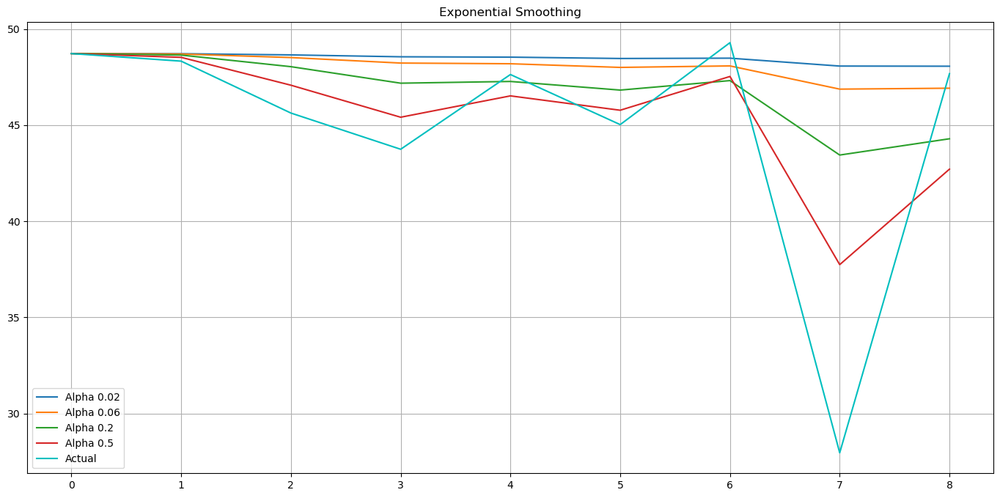

In [96]:
plot_exponential_smoothing(noct_dataframe_no_outliers['noct'], [0.02, 0.06, 0.2, 0.5])

In [93]:
# Wind Speed - Ambient temperature correction
WS_correction_df = noct_dataframe[["ambient_temp", "wind_speed", "ws_correction"]]
WS_correction_df

,ambient_temp,wind_speed,ws_correction
2022-08-12,39.488278,1.144081,-4
2022-08-14,34.710048,0.901725,1
2022-08-20,33.681408,1.245172,0
2022-09-01,38.982661,0.974825,-1
2022-11-04,16.606092,0.840771,0
2022-11-06,25.013972,0.968068,-1
2022-12-01,18.300000,1.026667,3
2023-01-05,16.100000,1.007083,0
2023-01-24,11.641825,0.735149,0
2023-02-03,22.517610,0.857753,-2


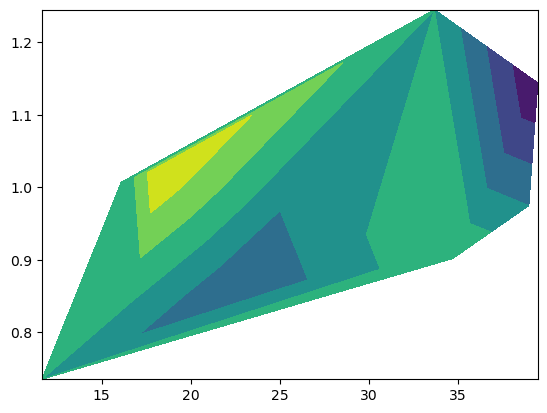

In [94]:
# Contour Plot example 1
import matplotlib.pyplot as plt
import numpy as np

X = WS_correction_df['ambient_temp']
Y = WS_correction_df['wind_speed']
Z = WS_correction_df["ws_correction"]

plt.tricontourf(X, Y, Z)
plt.show()

In [95]:
# Contour plot example 2

import matplotlib.pyplot as plt
import numpy as np
from pylab import *
X = WS_correction_df['ambient_temp']
Y = WS_correction_df['wind_speed']
Z = WS_correction_df["ws_correction"]



x, y = np.meshgrid(X, Y)
Z1 = bivariate_normal(x, y, 1.0, 1.0, 0.0, 0.0)
Z2 = bivariate_normal(x, y, 1.5, 0.5, 1, 1)
z = (Z1 - Z2) * 10

fig = plt.figure()
plt.contour(x, y, z, cmap="rainbow")
plt.show()

NameError: name 'bivariate_normal' is not defined

In [ ]:
# Contour Plot example 3

import plotly.graph_objects as go
import numpy as np
 
X = WS_correction_df['ambient_temp']
Y = WS_correction_df['wind_speed']
Z = WS_correction_df["ws_correction"]
 
fig = go.Figure(data =
     go.Contour(x = X, y = Y, z = Z, contours_coloring='lines',
               contours=dict(
        #coloring='lines',
                   coloring ='heatmap',
                   start=-3,
                   end=3,
                   size=1,
        showlabels=True,)))
 
fig.show()

In [ ]:
display(WS_correction_df)
display(pd.DataFrame(Z))

In [ ]:
#WS_correction_df.hvplot.bivariate(y='wind_speed', x='ambient_temp', z="ws_correction", width=600, height=500, colorbar=False)
import numpy as np
import matplotlib.cm as cm

x = WS_correction_df['ambient_temp']
y = WS_correction_df['wind_speed']
z = WS_correction_df["ws_correction"]

Z = WS_correction_df.pivot_table(index='ambient_temp', columns='wind_speed', values='ws_correction').T.values

X_unique = np.sort(WS_correction_df.ambient_temp.unique())
Y_unique = np.sort(WS_correction_df.wind_speed.unique())

X, Y = np.meshgrid(X_unique, Y_unique)

fig, ax = plt.subplots(1, 1)
ax = fig.add_subplot(111)
levels = np.array([-3, -2, -1, 0, 1, 2, 3])

cpf = ax.contourf(X, Y, Z)
fig.colorbar(cpf)

#cpf = ax.contourf(X, Y, Z, len(levels), cmap=cm.Reds)

#line_colors = ['black' for l in cpf.levels]

#cp = ax.contour(X, Y, Z, levels=levels, colors='black', linestyles='dashed')
#ax.clabel(cp, fontsize=10, colors=line_colors)
plt.title('Contour Plot')

plt.show()

In [ ]:
for key in model_dict:
    display(model_dict[key]['r_square'])
     display(model_dict[key]['plot'])

In [ ]:
# Create a visual scatter
noct_no_outlier['predicted'] = model.predict(X)
noct_no_outlier.hvplot.scatter(x='Irradiance_Pyr_NOCT_Avg', 
                                 y='T_RISE', 
                                 xlabel = "Irradiance",
                                 ylabel="Temperature Rise", 
                                 title="Temp Rise vs. Irradiance",
                                 color="blue"
                                ).opts(yformatter='%.0f') * noct_no_outlier.hvplot.line(
                                                x='Irradiance_Pyr_NOCT_Avg', 
                                                y='predicted',
                                                color='red')

In [ ]:
Y_pred = model.predict(X)  # make predictions
plt.scatter(X, Y, alpha=0.1)
plt.plot(X, Y_pred, color='red')
plt.show()

In [ ]:
covariance = noct_no_outlier['T_RISE'].cov(noct_no_outlier['Irradiance_Pyr_NOCT_Avg'])
covariance

In [ ]:
variance = noct_no_outlier['Irradiance_Pyr_NOCT_Avg'].var()
variance

In [ ]:
beta = covariance/variance
beta

In [ ]:
NOCT = beta * 800 + 20
NOCT

In [ ]:
NOCT = model.coef_ * 800 + 20 + model.intercept_
NOCT

In [ ]:
Tamb_WS = noct_no_outlier[["AirTemp_Avg", "Wind_speed"]]
Tamb_WS

In [ ]:
Tamb_WS.hvplot.bivariate(y='Wind_speed', x='AirTemp_Avg', xlim=(5, 40), ylim=(0.25,1.75), width=600, height=500)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)
cp = ax.contour(X, Y, Z)